In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns 
from sklearn.feature_extraction.text import CountVectorizer
count=CountVectorizer()
data=pd.read_csv("Train.csv")
data.head()

,text,label
0,I grew up (b. 1965) watching and loving the Th...,0
1,"When I put this movie in my DVD player, and sa...",0
2,Why do people who do not know what a particula...,0
3,Even though I have great interest in Biblical ...,0
4,Im a die hard Dads Army fan and nothing will e...,1


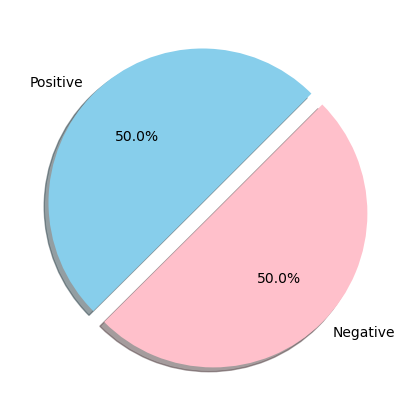

In [2]:
fig=plt.figure(figsize=(5,5))
colors=["skyblue",'pink']
pos=data[data['label']==1]
neg=data[data['label']==0]
ck=[pos['label'].count(),neg['label'].count()]
legpie=plt.pie(ck,labels=["Positive","Negative"],
                 autopct ='%1.1f%%', 
                 shadow = True,
                 colors = colors,
                 startangle = 45,
                 explode=(0, 0.1))

In [3]:
import re
def preprocessor(text):
             text=re.sub('<[^>]*>','',text)
             emojis=re.findall('(?::|;|=)(?:-)?(?:\)|\(|D|P)',text)
             text=re.sub('[\W]+',' ',text.lower()) +\
                ' '.join(emojis).replace('-','')
             return text   
data['text']=data['text'].apply(preprocessor)

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/anshverma/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Positive words are as follows


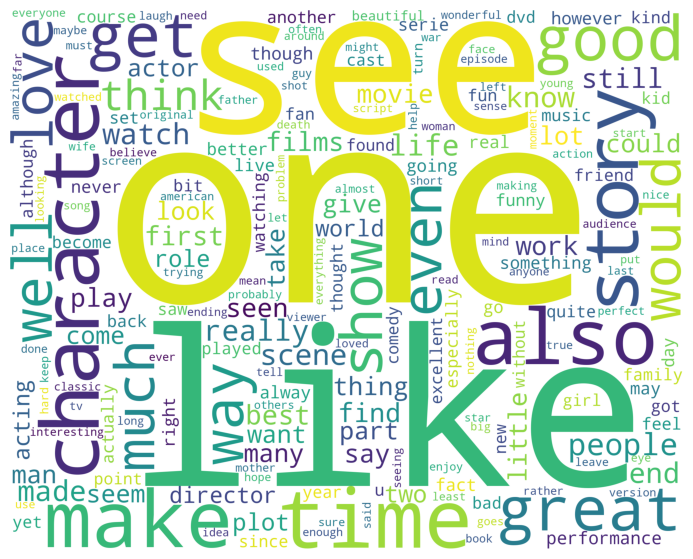

Negative words are as follows


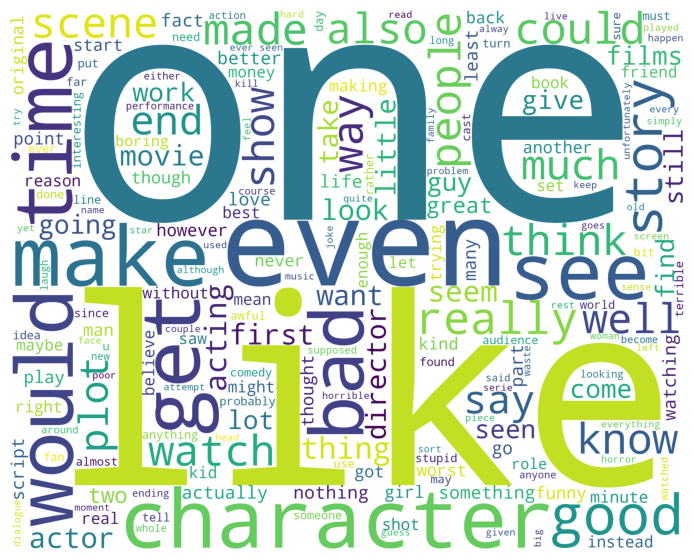

In [4]:
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
stop=stopwords.words('english')

from wordcloud import WordCloud
positivedata = data[ data['label'] == 1]
positivedata =positivedata['text']
negdata = data[data['label'] == 0]
negdata= negdata['text']

def wordcloud_draw(data, color = 'white'):
    words = ' '.join(data)
    cleaned_word = " ".join([word for word in words.split()
                              if(word!='movie' and word!='film')
                            ])
    wordcloud = WordCloud(stopwords=stop,
                      background_color=color,
                      width=2500,
                      height=2000
                     ).generate(cleaned_word)
    plt.figure(1,figsize=(10, 7))
    plt.imshow(wordcloud)
    plt.axis('off')
    plt.show()
    
print("Positive words are as follows")
wordcloud_draw(positivedata,'white')
print("Negative words are as follows")
wordcloud_draw(negdata)

In [8]:
from nltk.stem import PorterStemmer
from sklearn.feature_extraction.text import TfidfVectorizer

stemmer = PorterStemmer()

def tokenizer_porter(text):
    return [stemmer.stem(word) for word in text.split()]

tfidf = TfidfVectorizer(strip_accents=None, lowercase=False, preprocessor=None, tokenizer=tokenizer_porter, use_idf=True, norm='l2', smooth_idf=True)
y = data.label.values
x = tfidf.fit_transform(data.text)

/Users/anshverma/anaconda3/lib/python3.10/site-packages/sklearn/feature_extraction/text.py:528: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


In [12]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(x,y,random_state=1,test_size=0.5,shuffle=False)

In [13]:
from sklearn.linear_model import LogisticRegressionCV
clf=LogisticRegressionCV(cv=6,scoring='accuracy',random_state=0,n_jobs=-1,verbose=3,max_iter=500).fit(X_train,y_train)
y_pred = clf.predict(X_test)
from sklearn import metrics

# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        66596     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.15527D+04    |proj g|=  7.83076D+01


ITERATION     1

---------------- CAUCHY entered-------------------
 There are            0   breakpoints 

 GCP found in this segment
Piece      1 --f1, f2 at start point  -1.0507D+05  1.0507D+05
Distance to the stationary point =   1.0000D+00

---------------- exit CAUCHY----------------------

       66596  variables are free at GCP            1
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        66596     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.15527D+04    |proj g|=  7.76886D+01

RUNNING THE L-BFGS-B CODE


           * * *

ITERATION     1
Machine precision = 2.220D-16
 N =        66596     M =           10

---------------- CAUCHY entered-------------------
 Ther

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



04 -2.1264D-05 -4.8962D-05
      6.5685D-06  1.3117D-05  0.0000D+00  4.0002D-06 -1.0456D-05 -1.2010D-05
     -5.7004D-05 -2.5816D-05 -1.0216D-05  0.0000D+00  6.1024D-06  3.3548D-05
      0.0000D+00  7.4796D-05 -1.5959D-06 -3.8055D-06  0.0000D+00 -9.1822D-06
     -4.5620D-05 -1.9569D-05  0.0000D+00 -7.3006D-06  2.0377D-05 -1.8360D-06
      6.0242D-06 -3.3887D-04  2.2833D-06  3.1799D-06  6.2645D-06 -2.3804D-05
      0.0000D+00  6.7912D-06 -7.9474D-06 -1.5531D-05  0.0000D+00  0.0000D+00
      0.0000D+00  0.0000D+00  0.0000D+00  0.0000D+00  0.0000D+00  4.0796D-06
      0.0000D+00 -6.6807D-06  7.9959D-06  0.0000D+00 -4.0668D-06 -4.4518D-05
     -4.6105D-06  1.0204D-05  6.0201D-06  0.0000D+00 -6.5554D-06 -2.8060D-05
     -1.0663D-04  0.0000D+00  1.0867D-05 -8.4962D-06  5.7650D-06  3.5234D-06
     -9.1218D-06  1.4584D-08  8.6138D-06  0.0000D+00  0.0000D+00  3.0197D-05
      6.8103D-06  3.1872D-06 -2.9939D-05  6.0624D-06  3.7893D-06 -6.9708D-08
      4.2641D-06  5.2099D-06  4.5498D-06  0.0000D

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 This problem is unconstrained.


      6.1866D-04  0.0000D+00  9.7753D-04 -2.9978D-04  0.0000D+00  0.0000D+00
      6.6939D-03 -3.5392D-04 -2.1848D-04  4.5317D-04  0.0000D+00  6.9382D-04
     -6.4220D-04  0.0000D+00  6.8698D-04 -6.4929D-04  0.0000D+00  0.0000D+00
      2.5237D-06  0.0000D+00  5.7707D-04 -4.0617D-04 -2.5212D-04  3.6344D-04
     -6.1576D-04  0.0000D+00 -3.7253D-04  0.0000D+00  0.0000D+00  2.6545D-03
      0.0000D+00  0.0000D+00  0.0000D+00 -5.6456D-04  5.8247D-04  1.8172D-03
      0.0000D+00 -1.8357D-04  6.0894D-03 -2.2248D-04  0.0000D+00  0.0000D+00
     -3.5603D-05  0.0000D+00  0.0000D+00  3.4999D-04  5.2180D-04  1.9294D-04
      0.0000D+00  7.5171D-04 -1.0432D-03  7.1460D-04  6.1126D-04  2.2473D-03
      0.0000D+00  6.5844D-02  0.0000D+00  0.0000D+00  6.0933D-04 -3.3820D-04
      1.9622D-03  1.5042D-03  0.0000D+00  5.3939D-04 -1.5566D-03  1.6053D-03
     -8.7587D-04 -3.5520D-04  3.4789D-04 -4.9665D-04  0.0000D+00  0.0000D+00
     -9.0527D-04  0.0000D+00  3.8529D-04  7.3605D-04  2.0604D-04  0.0000D+00

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


903D-03  1.4957D-03
     -4.5354D-04 -1.0255D-03  3.0587D-03  1.5864D-04 -1.9279D-04 -1.8702D-04
      2.8304D-05  2.4868D-03  7.5733D-04  0.0000D+00 -5.2011D-02  0.0000D+00
      0.0000D+00  0.0000D+00  0.0000D+00  2.7168D-04 -1.9909D-03 -3.3777D-05
      4.8203D-04  6.0818D-04  7.1259D-04 -3.3860D-05  0.0000D+00  2.0074D-05
     -1.4144D-04  1.7783D-04  1.3550D-04  0.0000D+00  0.0000D+00  0.0000D+00
      0.0000D+00  2.4432D-04 -2.9827D-03  1.4961D-03  5.1328D-03  0.0000D+00
      0.0000D+00  0.0000D+00 -6.1243D-04  2.7015D-04  1.4541D-04 -4.0459D-04
      0.0000D+00  0.0000D+00 -1.3706D-03  0.0000D+00 -2.0723D-04 -2.6324D-03
     -2.0680D-04  1.1042D-03 -5.0125D-04 -7.0478D-04  0.0000D+00  6.1692D-04
      1.3709D-03 -1.3598D-03  6.8143D-04  0.0000D+00  4.6425D-03 -5.1374D-04
      3.5398D-04  2.5322D-04 -1.8583D-04 -4.7161D-04 -4.0463D-04  1.7675D-03
      1.4819D-03  3.0913D-04  6.8725D-04 -7.4581D-04  0.0000D+00 -2.6759D-04
      4.1201D-04 -9.5626D-04  5.8107D-03  5.8663D-03 -3.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 This problem is unconstrained.
 This problem is unconstrained.


1732D-02

     -7.0789D-03 -3.0765D-03  1.2442D-02  9.9413D-04 -2.9006D-03 -7.4296D-04
      0.0000D+00 -2.0778D-03  1.5747D-02  0.0000D+00  0.0000D+00  2.1854D-03
      3.2116D-02 -7.1027D-03  1.8883D-03  0.0000D+00 -4.2803D-03  0.0000D+00
At iterate   31    f=  7.45231D+03    |proj g|=  1.36739D+00
      0.0000D+00  3.2400D-03  0.0000D+00 -2.6509D-03  0.0000D+00  4.1703D-03
      8.9450D-03  0.0000D+00  0.0000D+00  0.0000D+00  5.5042D-03  1.7217D-03
      0.0000D+00 -4.3878D-03  7.9550D-03 -5.2163D-04 -2.4900D-03  2.7517D-02
      0.0000D+00 -4.6211D-03  0.0000D+00  1.1813D-02  0.0000D+00 -7.8135D-02
      0.0000D+00  0.0000D+00 -3.1256D-03  0.0000D+00  0.0000D+00  1.2582D-03
     -2.8883D-03 -2.9396D-02 -1.2543D-03 -5.4390D-03  3.9218D-03  0.0000D+00
      0.0000D+00 -1.9265D-03  1.4251D-02  0.0000D+00  1.0315D-03  0.0000D+00
      0.0000D+00  0.0000D+00 -4.5205D-02  0.0000D+00  0.0000D+00  5.3166D-03
      3.4197D-03 -7.3520D-03  0.0000D+00  0.0000D+00 -1.8604D-02 -2.4664D-03
     

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.




ITERATION    27

----------------SUBSM entered-----------------



ITERATION    53

----------------SUBSM entered-----------------


----------------exit SUBSM --------------------


----------------SUBSM entered-----------------


----------------exit SUBSM --------------------


----------------SUBSM entered-----------------


----------------exit SUBSM --------------------


----------------exit SUBSM --------------------

 LINE SEARCH           0  times; norm of step =    7.3764576932137427     

At iterate    3    f=  7.77843D+03    |proj g|=  1.43975D+02


ITERATION     4

----------------SUBSM entered-----------------

 LINE SEARCH           0  times; norm of step =    2.0102601054870015     

At iterate    7    f=  7.57878D+03    |proj g|=  1.19587D+02


ITERATION     8

----------------exit SUBSM --------------------

 LINE SEARCH           0  times; norm of step =    1.5859253893866603     

At iterate    9    f=  7.51293D+03    |proj g|=  4.30097D+01

----------------SUBSM

 This problem is unconstrained.
IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 This problem is unconstrained.
 This problem is unconstrained.
IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



000D+00  1.1764D-02  0.0000D+00 -8.6418D-02  7.3844D-02  3.5664D-03
     -4.8791D-01  0.0000D+00  0.0000D+00  1.3066D-02 -2.7299D-02 -2.6228D-02
      0.0000D+00  6.9002D-03  0.0000D+00  0.0000D+00 -2.6822D-03 -2.8805D-02
      2.1497D-02  0.0000D+00  0.0000D+00 -2.5305D-02  0.0000D+00 -1.8708D-02
      3.7781D-02 -7.1025D-02  2.2078D-02  1.4644D-02 -1.1462D-02 -1.6320D-02
      0.0000D+00  3.2091D-02  0.0000D+00 -5.7469D-02 -8.4356D-03 -5.0304D-03
      5.6398D-02 -2.4098D-03  9.0570D-02 -3.8111D-02  0.0000D+00  0.0000D+00
      4.4547D-03  0.0000D+00  1.8043D-02 -4.0038D-02  1.4275D-02  0.0000D+00
      9.8302D-02  3.1713D-02  6.9463D-03 -6.7297D-03  3.9593D-02 -3.2484D-03
      0.0000D+00 -5.6831D-02  3.9393D-02 -8.6991D-02 -6.2258D-02 -5.0506D-03
      1.8426D-02  8.7862D-01 -3.8538D-02  3.7405D-01 -6.6544D-03  0.0000D+00
      1.8784D-02  0.0000D+00 -1.0862D-01 -1.3470D-02  2.0466D-02  0.0000D+00
      0.0000D+00 -3.5385D-02 -7.9185D-02  4.3385D-02 -8.1880D-02  0.0000D+00
      0.

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



----------------exit SUBSM --------------------

 LINE SEARCH           0  times; norm of step =    3.6644905244804828     

At iterate    5    f=  5.08876D+03    |proj g|=  1.12732D+01
 LINE SEARCH           0  times; norm of step =    2.2095107063002991E-003

At iterate   37    f=  4.63534D+03    |proj g|=  4.10123D-02


ITERATION     6


ITERATION    38

----------------SUBSM entered-----------------


----------------exit SUBSM --------------------


----------------SUBSM entered-----------------

 LINE SEARCH           0  times; norm of step =    4.0290402228785271E-002

At iterate   48    f=  4.60037D+03    |proj g|=  4.14006D-01

----------------exit SUBSM --------------------



ITERATION    49

----------------SUBSM entered-----------------

 LINE SEARCH           0  times; norm of step =    4.6112058010905974     

At iterate    9    f=  4.61559D+03    |proj g|=  5.02351D+00

----------------exit SUBSM --------------------

 LINE SEARCH           0  times; norm of step =   0

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 This problem is unconstrained.




ITERATION    56

----------------exit SUBSM --------------------

 LINE SEARCH           0  times; norm of step =   0.13465823674664390     

At iterate   42    f=  2.22957D+03    |proj g|=  2.52953D-01


ITERATION    43
 LINE SEARCH           0  times; norm of step =   0.28829242050653719     

At iterate   41    f=  2.23102D+03    |proj g|=  3.28222D-01

----------------SUBSM entered-----------------



ITERATION    42

----------------SUBSM entered-----------------

 LINE SEARCH           0  times; norm of step =   0.65905952073147278     

At iterate   29    f=  2.20675D+03    |proj g|=  1.57664D+00

----------------exit SUBSM --------------------


----------------SUBSM entered-----------------



ITERATION    30

----------------exit SUBSM --------------------


----------------exit SUBSM --------------------


----------------SUBSM entered-----------------


----------------exit SUBSM --------------------

 LINE SEARCH           0  times; norm of step =   0.61950194506038925  

 This problem is unconstrained.


 LINE SEARCH           0  times; norm of step =    1.6852575935236033E-002



ITERATION    96
At iterate  109    f=  2.23058D+03    |proj g|=  2.34662D-01

----------------SUBSM entered-----------------



ITERATION   110
 LINE SEARCH           0  times; norm of step =   0.16135411238156280     

At iterate   69    f=  2.24249D+03    |proj g|=  7.06126D-02

----------------SUBSM entered-----------------


----------------exit SUBSM --------------------


----------------SUBSM entered-----------------



ITERATION    70

----------------exit SUBSM --------------------


----------------exit SUBSM --------------------


----------------SUBSM entered-----------------

 LINE SEARCH           1  times; norm of step =    8.2226971169400351E-002

At iterate  101    f=  2.22385D+03    |proj g|=  9.47292D-01
 LINE SEARCH           0  times; norm of step =    19.582628253233732     

At iterate    3    f=  9.24979D+02    |proj g|=  6.95727D+01


ITERATION   102


ITERATION     4

---------------

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 This problem is unconstrained.
 This problem is unconstrained.
IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




      0.0000D+00  0.0000D+00 -6.6893D-01  3.3542D-02  0.0000D+00 -8.5011D-01
      0.0000D+00  0.0000D+00  0.0000D+00  0.0000D+00  1.7911D-02 -4.8124D-01
      2.2890D-02  1.2096D-01 -7.9530D-01  0.0000D+00  0.0000D+00  6.9832D-01
      8.3491D-02  0.0000D+00  0.0000D+00  0.0000D+00  0.0000D+00 -5.1332D-01
     -7.1784D-01  0.0000D+00  6.2451D-01  0.0000D+00  1.9285D+00  8.0659D-01
     -5.3001D-01  0.0000D+00  0.0000D+00  0.0000D+00  8.0635D-02  3.4595D-01
      2.3721D-02  5.7398D-02 -1.6904D-02 -1.5625D-01 -3.7608D-01  0.0000D+00
      0.0000D+00 -4.2350D-01 -8.1509D-01  1.9418D-01  4.6286D-01 -6.8983D-01
      2.1942D-02  0.0000D+00 -2.3689D+00  0.0000D+00  0.0000D+00  0.0000D+00
     -1.5754D-01  0.0000D+00 -3.5660D-04 -4.3562D-01  5.9292D-01 -1.9825D-01
      8.3261D-02 -2.0611D-02  1.9728D-02  0.0000D+00  6.0279D-01  4.3477D-01
      0.0000D+00 -3.1321D-01  2.4555D-02 -1.1481D+00 -2.3796D-01  6.0983D-01
      0.0000D+00  1.1278D-01  0.0000D+00  0.0000D+00  0.0000D+00  0.0000D+0

 This problem is unconstrained.
 This problem is unconstrained.


 LINE SEARCH           0  times; norm of step =    3.1976829448263944     

At iterate   11    f=  7.80610D+02    |proj g|=  2.02770D+00
 LINE SEARCH           0  times; norm of step =   0.53631814595970695     

At iterate   86    f=  7.80673D+02    |proj g|=  3.37544D-01


ITERATION    87


ITERATION    12

----------------SUBSM entered-----------------


----------------SUBSM entered-----------------

 LINE SEARCH           0  times; norm of step =    1.8473739577637263     

At iterate   58    f=  7.78399D+02    |proj g|=  2.22181D+00


ITERATION    59

----------------exit SUBSM --------------------

 LINE SEARCH           0  times; norm of step =    1.6387075185920241     

At iterate   29    f=  7.76623D+02    |proj g|=  1.37881D+00

----------------exit SUBSM --------------------



ITERATION    30

----------------SUBSM entered-----------------


----------------exit SUBSM --------------------


----------------SUBSM entered-----------------


----------------exit SUBSM ------

 This problem is unconstrained.



----------------SUBSM entered-----------------


----------------SUBSM entered-----------------


----------------exit SUBSM --------------------


----------------exit SUBSM --------------------

 LINE SEARCH           0  times; norm of step =    18.252849842266709     

At iterate    6    f=  2.13743D+02    |proj g|=  3.24458D-01


ITERATION     7
 LINE SEARCH           0  times; norm of step =    3.6920875464312539E-002

At iterate  243    f=  7.75245D+02    |proj g|=  7.60351D-02

----------------SUBSM entered-----------------



ITERATION   244

----------------exit SUBSM --------------------


----------------SUBSM entered-----------------


----------------exit SUBSM --------------------

 LINE SEARCH           0  times; norm of step =    1.1644967536123863E-002

At iterate  181    f=  7.65156D+02    |proj g|=  1.87550D-02


ITERATION   182
 LINE SEARCH           0  times; norm of step =    4.3364201047613980E-002

At iterate  217    f=  7.69537D+02    |proj g|=  1.95919D-02
 L

 This problem is unconstrained.
IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

 This problem is unconstrained.
 This problem is unconstrained.




ITERATION   256
 LINE SEARCH           0  times; norm of step =    6.8462615491156412E-002

At iterate   51    f=  2.07820D+02    |proj g|=  3.34365D-02
 LINE SEARCH           0  times; norm of step =    4.0570202815713143     

At iterate    9    f=  2.08241D+02    |proj g|=  1.07415D+00


ITERATION    52


ITERATION    10

----------------SUBSM entered-----------------


----------------SUBSM entered-----------------


----------------SUBSM entered-----------------

 LINE SEARCH           1  times; norm of step =   0.48214331788903059     

----------------exit SUBSM --------------------


At iterate   25    f=  2.03941D+02    |proj g|=  1.10238D+00

----------------exit SUBSM --------------------


----------------exit SUBSM --------------------



ITERATION    26

----------------SUBSM entered-----------------


 LINE SEARCH           0  times; norm of step =    1.8127827637633993E-002

At iterate  256    f=  7.67494D+02    |proj g|=  1.49811D-02
----------------exit SUBSM ------

 This problem is unconstrained.
IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




----------------SUBSM entered-----------------



ITERATION    22
 LINE SEARCH           0  times; norm of step =    1.5893260336106059     

At iterate   53    f=  2.03330D+02    |proj g|=  5.72989D-02


ITERATION    54

----------------exit SUBSM --------------------


----------------SUBSM entered-----------------

 LINE SEARCH           0  times; norm of step =   0.19630943976949200     

At iterate   76    f=  2.07780D+02    |proj g|=  5.37208D-02


ITERATION    77

----------------SUBSM entered-----------------


----------------exit SUBSM --------------------


----------------SUBSM entered-----------------


----------------exit SUBSM --------------------

 LINE SEARCH           0  times; norm of step =   0.19560920234835574     

At iterate   37    f=  2.04917D+02    |proj g|=  1.05558D-01

----------------exit SUBSM --------------------



ITERATION    38

----------------SUBSM entered-----------------

 LINE SEARCH           0  times; norm of step =    1.2501859391306611   

 This problem is unconstrained.


 LINE SEARCH           0  times; norm of step =    2.2974199595051310     

At iterate   51    f=  2.00809D+02    |proj g|=  4.58234D-01

----------------exit SUBSM --------------------



ITERATION    52

----------------exit SUBSM --------------------

 LINE SEARCH           0  times; norm of step =   0.39404122431692468     

At iterate   34    f=  2.08490D+02    |proj g|=  9.58733D-02

----------------SUBSM entered-----------------

 LINE SEARCH           0  times; norm of step =    1.5584671926303701     

At iterate   52    f=  2.04762D+02    |proj g|=  1.37985D-02


ITERATION    35


ITERATION    53

----------------exit SUBSM --------------------


----------------SUBSM entered-----------------


----------------SUBSM entered-----------------


----------------exit SUBSM --------------------


----------------exit SUBSM --------------------

 LINE SEARCH           0  times; norm of step =   0.74249195908698773     

At iterate   66    f=  2.03232D+02    |proj g|=  6.20664D-02



 This problem is unconstrained.
 This problem is unconstrained.


 LINE SEARCH           0  times; norm of step =   0.16159823174770624     

At iterate  176    f=  2.03907D+02    |proj g|=  3.26893D-02

----------------SUBSM entered-----------------



ITERATION   177

----------------exit SUBSM --------------------


----------------SUBSM entered-----------------

 LINE SEARCH           0  times; norm of step =   0.14385990638889543     

----------------exit SUBSM --------------------

 LINE SEARCH           0  times; norm of step =    1.5795727143808277E-002

At iterate  227    f=  2.04694D+02    |proj g|=  3.07724D-03

At iterate  220    f=  2.00242D+02    |proj g|=  3.05499D-02


ITERATION   221


ITERATION   228
 LINE SEARCH           0  times; norm of step =   0.13498577765981207     

At iterate  201    f=  2.06434D+02    |proj g|=  1.04417D-01
 LINE SEARCH           0  times; norm of step =    38.235645169876925     

At iterate    5    f=  4.66410D+01    |proj g|=  7.84381D-01


ITERATION     6

----------------SUBSM entered---------------

 This problem is unconstrained.




ITERATION   254

----------------exit SUBSM --------------------


----------------SUBSM entered-----------------


----------------SUBSM entered-----------------


----------------exit SUBSM --------------------


----------------exit SUBSM --------------------

 LINE SEARCH           0  times; norm of step =    2.3770913070997889E-002

At iterate  233    f=  2.06430D+02    |proj g|=  5.79617D-03
 LINE SEARCH           0  times; norm of step =   0.53091942508149137     

At iterate   39    f=  4.59894D+01    |proj g|=  6.72364D-02


ITERATION    40


ITERATION   234
 LINE SEARCH           0  times; norm of step =    1.0368530818017758     

At iterate   30    f=  4.72459D+01    |proj g|=  8.02145D-02

----------------SUBSM entered-----------------

 LINE SEARCH           1  times; norm of step =    3.5377686037066237E-002

At iterate  210    f=  2.03905D+02    |proj g|=  2.65057D-03

----------------SUBSM entered-----------------



ITERATION    31


ITERATION   211

---------------

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




----------------SUBSM entered-----------------

 LINE SEARCH           1  times; norm of step =    1.0416023555374117     

At iterate   55    f=  4.52490D+01    |proj g|=  3.00223D-02


ITERATION    56
 LINE SEARCH           0  times; norm of step =   0.15655263290216886     

At iterate  161    f=  4.58842D+01    |proj g|=  4.27055D-03

----------------exit SUBSM --------------------



ITERATION   162
 LINE SEARCH           0  times; norm of step =    8.2236225847781452E-002

At iterate  120    f=  4.62908D+01    |proj g|=  3.48123D-03

----------------SUBSM entered-----------------



ITERATION   121

----------------SUBSM entered-----------------

 LINE SEARCH           0  times; norm of step =   0.48464374082278400     

At iterate   77    f=  4.61158D+01    |proj g|=  4.68796D-03

----------------exit SUBSM --------------------



ITERATION    78

----------------SUBSM entered-----------------


----------------exit SUBSM --------------------


----------------SUBSM entered----

 This problem is unconstrained.




ITERATION   133

----------------SUBSM entered-----------------

 LINE SEARCH           0  times; norm of step =    4.0426309912257414     

At iterate    8    f=  4.69328D+01    |proj g|=  5.28751D-02

----------------SUBSM entered-----------------



ITERATION     9

----------------SUBSM entered-----------------


----------------exit SUBSM --------------------


----------------SUBSM entered-----------------


----------------exit SUBSM --------------------


----------------exit SUBSM --------------------

 LINE SEARCH           0  times; norm of step =    5.5161956402312980E-002

At iterate  164    f=  4.70160D+01    |proj g|=  4.20288D-03

----------------exit SUBSM --------------------



ITERATION   165

----------------SUBSM entered-----------------


----------------exit SUBSM --------------------

 LINE SEARCH           0  times; norm of step =   0.48224229574312927     

At iterate   89    f=  4.61043D+01    |proj g|=  2.01224D-02
 LINE SEARCH           0  times; norm of

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

